Mruganshi Gohel

B20CS014

## Part-1

In [1]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf

# Data Loading
from tensorflow import io
from tensorflow import data as tfd
from tensorflow import image as tfi
from keras.preprocessing.image import ImageDataGenerator

# Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt

from skimage import io, color


### 1.1

In [2]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"gohelmruganshi","key":"31c091e123d0c47ecc4ece4d539cd603"}'}

In [3]:
 ! mkdir ~/.kaggle


! cp kaggle.json ~/.kaggle/

In [4]:
 ! chmod 600 ~/.kaggle/kaggle.json

In [5]:
! kaggle datasets download -d utkarshsaxenadn/landscape-recognition-image-dataset-12k-images

100% 495M/496M [00:06<00:00, 124MB/s]
100% 496M/496M [00:06<00:00, 84.6MB/s]


In [6]:
! unzip landscape-recognition-image-dataset-12k-images.zip

Streaming output truncated to the last 5000 lines.
  inflating: Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1449).jpeg  
  inflating: Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (145).jpeg  
  inflating: Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1450).jpeg  
  inflating: Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1451).jpeg  
  inflating: Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1452).jpeg  
  inflating: Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1453).jpeg  
  inflating: Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1454).jpeg  
  inflating: Landscape Classification/Landscape Classification/Training Data/Glacier/Glacier-Train (1455).jpeg  
  inflating: Landscape Classification/Landscap

In [7]:

train_path = "Landscape Classification/Landscape Classification/Training Data/"
valid_path = "Landscape Classification/Landscape Classification/Validation Data/"
test_path =  "Landscape Classification/Landscape Classification/Testing Data/"


In [8]:
class_names = sorted(os.listdir(train_path))
n_classes = len(class_names)

In [9]:

print(f"Number of Classes : {n_classes}\nClass names : {class_names}")

Number of Classes : 5
Class names : ['Coast', 'Desert', 'Forest', 'Glacier', 'Mountain']


In [10]:
class_dis = [len(os.listdir(train_path + name)) for name in class_names]
fig = px.pie(names=class_names, values=class_dis, title="Training Class Distribution", hole=0.4)
fig.update_layout({'title':{'x':0.5}})
fig.show()

In [11]:
class_dis = [len(os.listdir(valid_path + name)) for name in class_names]


# Visualize
fig = px.pie(names=class_names, values=class_dis, title="Validation Class Distribution", hole=0.4)
fig.update_layout({'title':{'x':0.5}})
fig.show()

In [12]:
class_dis = [len(os.listdir(test_path + name)) for name in class_names]


# Visualize
fig = px.pie(names=class_names, values=class_dis, title="Testing Class Distribution", hole=0.4)
fig.update_layout({'title':{'x':0.5}})
fig.show()

### 1.2

In [13]:
tfr_train = "Landscape Classification/Landscape Classification/TFrecords/Train/"
tfr_valid = "Landscape Classification/Landscape Classification/TFrecords/Valid/"
tfr_test = "Landscape Classification/Landscape Classification/TFrecords/Test/"

In [14]:
print(f"Train TFRecords : {len(os.listdir(tfr_train))} = {len(os.listdir(tfr_train))//5} X 5")
print(f"Valid TFRecords : {len(os.listdir(tfr_valid))} = {len(os.listdir(tfr_valid))//5} X 5")
print(f"Test TFRecords : {len(os.listdir(tfr_test))} = {len(os.listdir(tfr_test))//5} X 5")

Train TFRecords : 10000 = 2000 X 5
Valid TFRecords : 1500 = 300 X 5
Test TFRecords : 500 = 100 X 5


### 1.3

In [15]:
def decode_image(image):
    image = tfi.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32)
    image = image/255.
    return image

def decode_data(example):
    features = {
        'image': tf.io.FixedLenFeature([], tf.string),
        'label': tf.io.FixedLenFeature([], tf.int64)
    }

    example = tf.io.parse_single_example(example, features)
    image, label = example['image'], example['label']
    image = decode_image(image)
    return image, label


def load_data(file_dir, BATCH_SIZE=32, BUFFER=1000):
    AUTOTUNE = tfd.AUTOTUNE
    file_dir = file_dir + "*.tfrecord"
    files = tfd.Dataset.list_files(file_dir)
    data = tfd.TFRecordDataset(files, num_parallel_reads=AUTOTUNE)
    data = data.map(decode_data, num_parallel_calls=AUTOTUNE)
    data = data.shuffle(BUFFER).batch(BATCH_SIZE, drop_remainder=True)
    data = data.prefetch(AUTOTUNE)
    return data

In [16]:
train_ds = load_data(file_dir=tfr_train)
valid_ds = load_data(file_dir=tfr_valid)
test_ds = load_data(file_dir=tfr_test)
train_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(32, None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(32,), dtype=tf.int64, name=None))>

#### Visualise data

In [17]:
def plot_images(data, class_names=class_names):
    n_images = 15
    plt.figure(figsize=(25,25))
    i=1
    data_iter = iter(data)
    i = 1
    while i <= n_images:
        try:
            images, labels = next(data_iter)
            id = np.random.randint(len(images))
            image, label = tf.expand_dims(images[id], axis=0), class_names[int(labels[id])]

            plt.subplot(3, 5, i)
            plt.imshow(image[0])
            plt.title(label)
            plt.axis('off')
            i += 1
        except StopIteration:
            break



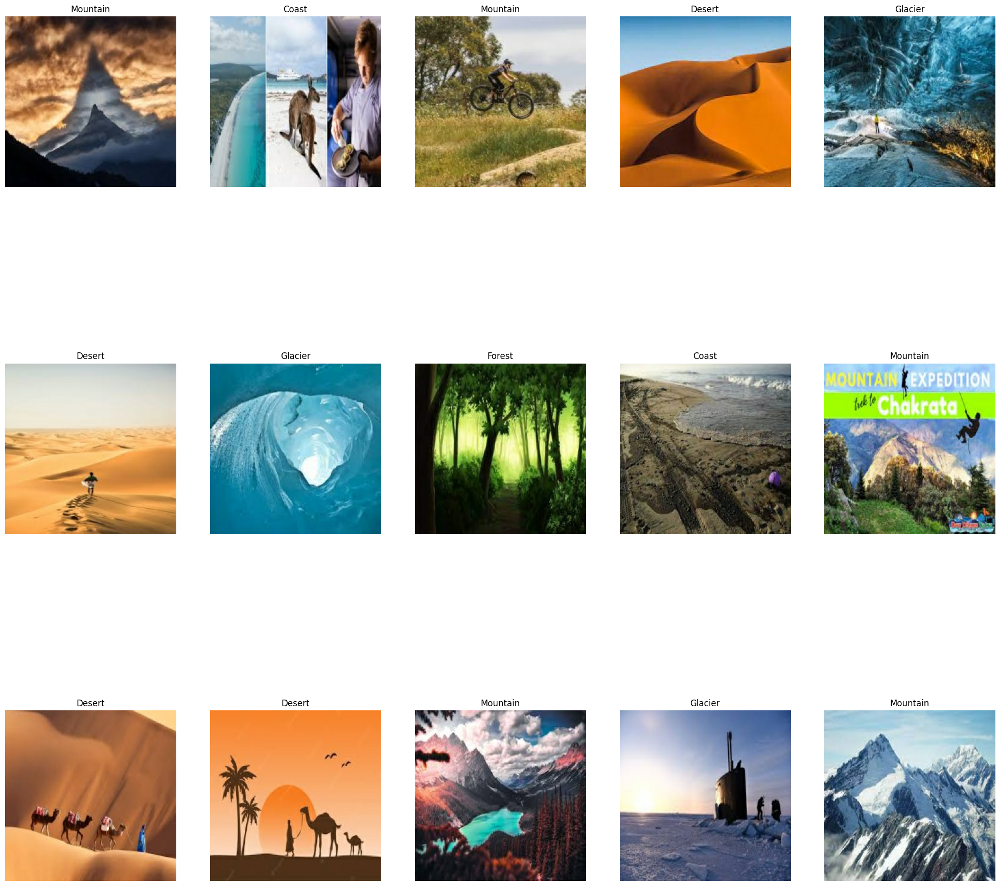

In [18]:
plot_images(train_ds)

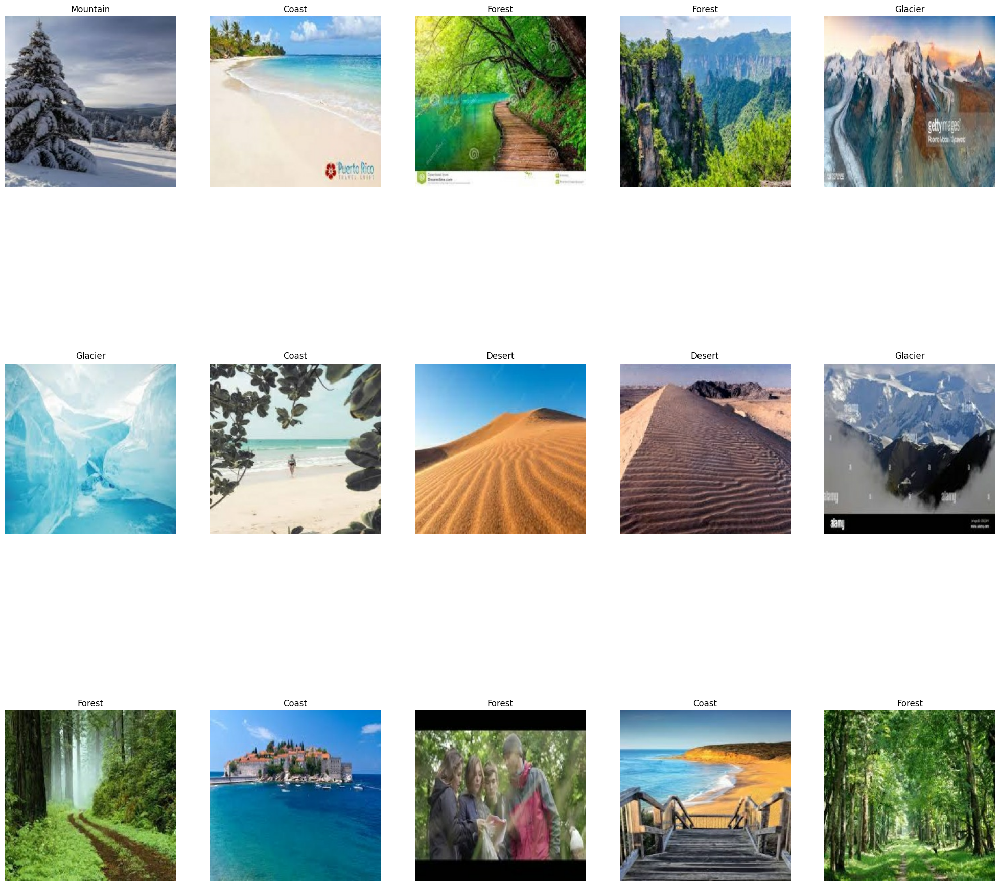

In [19]:
plot_images(test_ds)

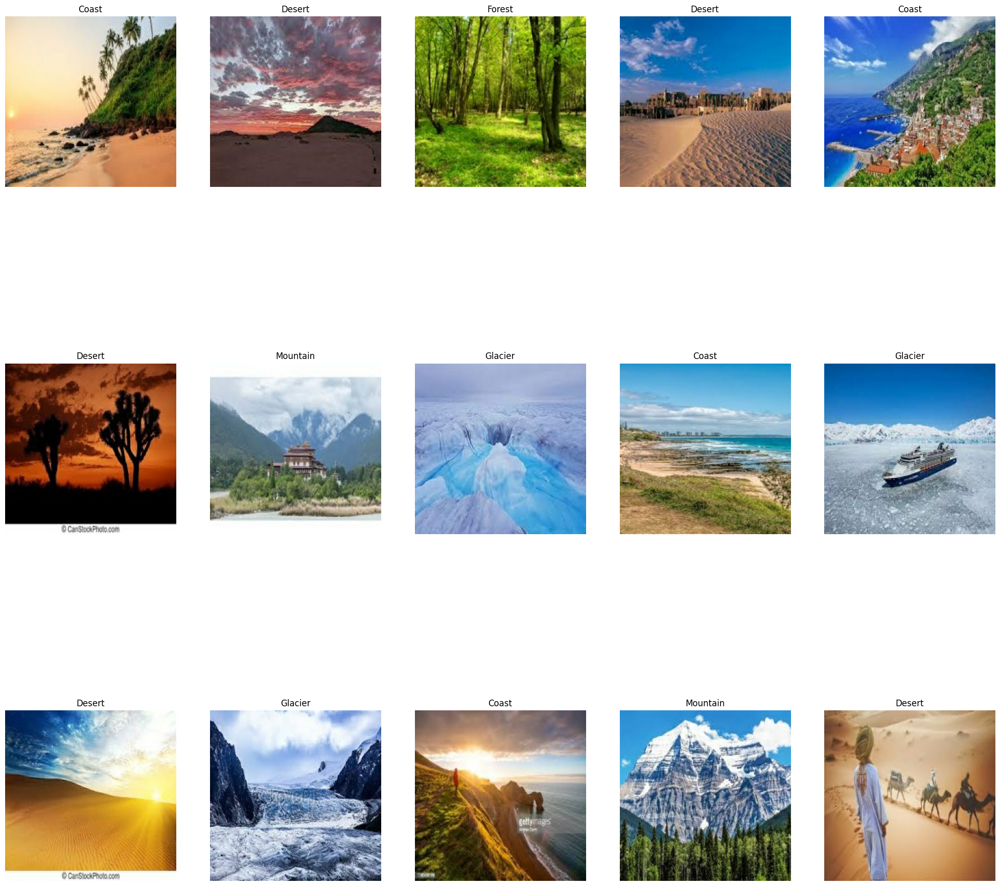

In [20]:
plot_images(valid_ds)

From the images we can clearly notice that the model will have to pay attention to the colours and geometry of the area.



#### Feature Extraction using GIST

This dictionary holds the key parameters necessary for GIST feature extraction.

'orientations_per_scale' specifies the number of orientations for each scale.

'numberBlocks' determines the number of blocks in both x and y dimensions for GIST computation.

'fc_prefilt' sets the cutoff frequency for prefiltering.


 'boundary_extension' controls the boundary extension for GIST processing to handle edges.

You can adjust these parameters based on your specific dataset and analysis requirements.

In [21]:
import numpy as np

# Define the parameter dictionary for GIST feature extraction
param = {
    "orientations_per_scale": np.array([8, 8]),  # Number of orientations per scale
    "numberBlocks": [10, 10],  # Number of blocks in x and y dimensions
    "fc_prefilt": 10,  # Cutoff frequency for prefiltering
    "boundary_extension": 32  # Boundary extension for GIST processing
}


In [22]:
import numpy as np
import numpy.matlib as np_matlib
import numpy.fft as np_fft
from PIL import Image
from skimage.feature import local_binary_pattern
from skimage.color import rgb2gray

def create_gabor_filters(orientations, n):
    # Initialize a list to store Gabor filter parameters
    gabor_params = []

    # Determine the number of scales and total orientations
    num_scales = len(orientations)
    num_filters = sum(orientations)

    # Ensure n is a 2-element list even if only one value is provided
    if len(n) == 1:
        n = [n[0], n[0]]

    i = 0
    while i < num_scales:
        j = 0
        while j < orientations[i]:
            # Append Gabor filter parameters to the list
            gabor_params.append([0.35, 0.3 / (1.85**i), 16 * orientations[i]**2 / 32**2, np.pi / orientations[i] * j])
            j += 1
        i += 1

    # Convert the list of Gabor parameters to a NumPy array for efficient calculations
    gabor_params = np.array(gabor_params)

    # Create a grid of coordinates for Gabor filter construction
    fx, fy = np.meshgrid(np.arange(-n[1] / 2, n[1] / 2 - 1 + 1), np.arange(-n[0] / 2, n[0] / 2 - 1 + 1))

    # Calculate the radial frequency component
    fr = np_fft.fftshift(np.sqrt(fx**2 + fy**2))

    # Calculate the angular component and ensure it is within the range [-π, π]
    t = np_fft.fftshift(np.angle(fx + 1j * fy))

    # Initialize an array to store Gabor filters
    G = np.zeros([n[0], n[1], num_filters])

    i = 0
    while i < num_filters:
        tr = t + gabor_params[i, 3]
        tr += 2 * np.pi * (tr < -np.pi) - 2 * np.pi * (tr > np.pi)
        # Construct the Gabor filter using parameters
        G[:, :, i] = np.exp(-10 * gabor_params[i, 0] * (fr / n[1] / gabor_params[i, 1] - 1)**2 - 2 * gabor_params[i, 2] * np.pi * tr**2)
        i += 1

    return G


In [23]:
def more_config(img):
    # Update the 'image_size' parameter in the dictionary with the dimensions of the input image
    param["image_size"] = [img.shape[0], img.shape[1]

    # Calculate the size of the Gabor filters by adding twice the boundary extension to the image dimensions
    filter_size = np.array(param["image_size"]) + 2 * param["boundary_extension"]

    # Create Gabor filters based on the specified 'orientations_per_scale' and the calculated filter size
    param["gabor_filters"] = create_gabor_filters(param["orientations_per_scale"], filter_size)


In [24]:
def preprocess(img):
    # Get the desired image size from the 'param' dictionary
    M = param["image_size"]

    # Ensure 'M' is a list with two elements even if only one value is provided
    if len(M) == 1:
        M = [M, M]

    # Calculate the scale factor to resize the input image
    scale = np.max([M[0] / img.shape[0], M[1] / img.shape[1]])

    # Compute the new size based on the scale factor
    new_size = list(map(int, np.round(np.array([img.shape[1], img.shape[0]]) * scale))

    # Resize the image using bilinear interpolation to match the desired size
    img = np.array(Image.fromarray(img).resize(new_size, Image.BILINEAR))

    # Calculate the new dimensions of the resized image
    nr, nc = img.shape

    # Compute the starting row and column indices for cropping
    sr = (nr - M[0]) / 2
    sc = (nc - M[1]) / 2

    # Crop the image to the desired size
    img = img[int(sr):int(sr + M[0]) + 1, int(sc):int(sc + M[1]) + 1

    # Normalize the pixel values to the range [0, 255]
    img = img - np.min(img)

    # Ensure the image has a valid range, and scale the values to [0, 255]
    if np.sum(img) != 0:
        img = 255 * (img / np.max(img))

    return img


In [25]:
def prefilt(img):
    # Set the size of the half-width of the window for filtering
    w = 5

    # Get the cutoff frequency for prefiltering from the 'param' dictionary
    fc = param["fc_prefilt"]

    # Calculate the standard deviation of the Gaussian filter
    s1 = fc / np.sqrt(np.log(2))

    # Apply a logarithm transformation to the input image
    img = np.log(img + 1)

    # Pad the image symmetrically with a specified width 'w'
    img = np.pad(img, [w, w], "symmetric")

    # Get the dimensions of the padded image
    sn, sm = img.shape

    # Determine the maximum dimension among 'sn' and 'sm'
    n = np.max([sn, sm])

    # Ensure 'n' is even
    n += n % 2

    # Pad the image further based on its dimensions
    if sn == sm:
        img = np.pad(img, [0, int(n - sn)], "symmetric")
    elif sn < sm:
        img = np.pad(img, [0, int(n - sn)], "symmetric")[:, :sm + (1 if sm % 2 != 0) else 0]
    else:
        img = np.pad(img, [0, int(n - sm)], "symmetric")[sn - sm:]

    # Create the mesh grid for frequency domain filtering
    fx, fy = np.meshgrid(np.arange(-n / 2, n / 2 - 1 + 1), np.arange(-n / 2, n / 2 - 1 + 1))

    # Calculate the Gaussian filter in the frequency domain
    gf = np_fft.fftshift(np.exp(-(fx**2 + fy**2) / (s1**2)))

    # Replicate the Gaussian filter to match the image size
    gf = np_matlib.repmat(gf, 1, 1)

    # Perform prefiltering by subtracting the filtered result in the spatial domain
    output = img - np.real(np_fft.ifft2(np_fft.fft2(img) * gf))

    # Compute the local standard deviation in the frequency domain
    localstd = np_matlib.repmat(np.sqrt(abs(np_fft.ifft2(np_fft.fft2(output**2) * gf)), 1, 1)

    # Normalize the prefiltered image with respect to local standard deviation
    output = output / (0.2 + localstd)

    # Crop the prefiltered image to its original size
    output = output[w:sn - w, w:sm - w]

    return output


In [26]:
def downN(x, N):
    # Calculate the indices for dividing the image in the x-axis
    nx = list(map(int, np.floor(np.linspace(0, x.shape[0], N[0] + 1)))

    # Calculate the indices for dividing the image in the y-axis
    ny = list(map(int, np.floor(np.linspace(0, x.shape[1], N[1] + 1)))

    # Initialize an empty grid to store downsampled values
    y = np.zeros((N[0], N[1]))

    # Initialize an index for the x-axis
    xx = 0

    # Loop through the x-axis divisions
    while xx < N[0]:
        # Initialize an index for the y-axis
        yy = 0

        # Loop through the y-axis divisions
        while yy < N[1]:
            # Extract the subregion of the input image
            a = x[nx[xx]:nx[xx + 1], ny[yy]:ny[yy + 1]]

            # Calculate the mean value of the subregion
            v = np.mean(np.mean(a, 0))

            # Store the mean value in the downsampled grid
            y[xx, yy] = v

            yy += 1

        xx += 1

    return y


In [27]:
def gistGabor(img):
    # Extract parameters from the global 'param' dictionary
    w = param["numberBlocks"]
    G = param["gabor_filters"]
    be = param["boundary_extension"]
    ny, nx, Nfilters = G.shape

    # Calculate the dimensions of the output feature vector
    W = w[0] * w[1]
    N = 1

    # Initialize an empty feature vector 'g'
    g = np.zeros((W * Nfilters, N))

    # Pad the input image with boundary extension and perform 2D FFT
    img = np.pad(img, [be, be], "symmetric")
    img = np_fft.fft2(img)

    k = 0
    n = 0

    # Iterate through the Gabor filters
    while n < Nfilters:
        # Convolve the input image with the Gabor filter
        ig = abs(np_fft.ifft2(img * np_matlib.repmat(G[:, :, n], 1, 1))

        # Crop the result to remove the boundary extension
        ig = ig[be:ny - be, be:nx - be]

        # Downsample the filtered image using 'downN'
        v = downN(ig, w)

        # Store the downsampled feature vector in 'g'
        g[k:k + W, 0] = v.reshape([W, N], order="F").flatten()
        k += W
        n += 1

    return np.array(g)


In [28]:
def pipeline_execution(img):
    # Configure parameters related to GIST extraction based on the input image
    more_config(img)

    # Preprocess the input image
    img = preprocess(img)

    # Apply pre-filtering to the preprocessed image
    op = prefilt(img)

    # Extract Gabor features from the pre-filtered image
    gist = gistGabor(op)

    # Flatten the Gabor feature vector for the final output
    return gist.flatten()


In [29]:

def get_paths(root_directory):
  # List to store image paths and labels
  image_paths = []
  labels = []

  # List of class directories (assumes each class has a separate subdirectory)
  class_directories = os.listdir(root_directory)

  # Map class directories to class labels
  class_to_label = {class_dir: label for label, class_dir in enumerate(class_directories)}

  # Iterate through each class directory
  for class_dir in class_directories:
      class_path = os.path.join(root_directory, class_dir)
      class_label = class_to_label[class_dir]

      # Iterate through the images in the class directory
      for filename in os.listdir(class_path):
          image_path = os.path.join(class_path, filename)
          image_paths.append(image_path)
          labels.append(class_label)

  return image_paths, labels

In [30]:
import random
train_directory = "Landscape Classification/Landscape Classification/Training Data"
train_image_paths = get_paths(train_directory)
random.shuffle(train_image_paths[0])

test_directory = "Landscape Classification/Landscape Classification/Testing Data"
test_image_paths = get_paths(test_directory)
random.shuffle(test_image_paths[0])

val_directory = "Landscape Classification/Landscape Classification/Validation Data"
val_image_paths = get_paths(val_directory)
random.shuffle(val_image_paths[0])

In [31]:
def quantize_features(input_features, num_categories=5):
    quantized_input = np.digitize(input_features, np.linspace(0, input_features.max(), num_categories))
    return quantized_input


In [56]:
import multiprocessing as mp
from tqdm import tqdm
from PIL import Image
import numpy as np

def _get_gist(file_list: list) -> np.array:
    # Load and convert images to grayscale
    img_list = list(map(lambda f: np.array(Image.open(f).convert("L")), file_list))

    with mp.Pool(mp.cpu_count()) as pool:
        # Use multiprocessing to parallelize the feature extraction
        p = pool.imap(pipeline_execution, img_list)
        gist_feature = list(tqdm(p, total=len(img_list)))

    return np.array(gist_feature)


In [57]:
train_gist_features = _get_gist(train_image_paths[0])

100%|██████████| 10000/10000 [41:33<00:00,  4.01it/s]


In [58]:
qt_features_train = quantize_features(train_gist_features)

In [59]:
train_dt = np.column_stack((qt_features_train, train_image_paths[1]))

In [60]:
import numpy as np
parameters = {
        "orientationsPerScale":np.array([8,8]),
         "numberBlocks":[10,10],
        "fc_prefilt":10,
        "boundaryExtension":32
}

In [61]:
test_gist_features = _get_gist(test_image_paths[0])

100%|██████████| 500/500 [03:09<00:00,  2.64it/s]


In [62]:
qt_features_test = quantize_features(test_gist_features)
test_dt = np.column_stack((qt_features_test, test_image_paths[1]))

In [63]:
valid_gist_features = _get_gist(val_image_paths[0])

100%|██████████| 1500/1500 [06:19<00:00,  3.96it/s]


In [64]:
qt_features_valid = quantize_features(valid_gist_features)
valid_dt = np.column_stack((qt_features_valid, val_image_paths[1]))

## Part-2

Bayesian Network classifier

In [65]:
import math
import random
import csv


# the categorical class names are changed to numberic data
# eg: yes and no encoded to 1 and 0
def encode_class(mydata):
    classes = []
    for i in range(len(mydata)):
        if mydata[i][-1] not in classes:
            classes.append(mydata[i][-1])
    for i in range(len(classes)):
        for j in range(len(mydata)):
            if mydata[j][-1] == classes[i]:
                mydata[j][-1] = i
    return mydata

# Group the data rows under each class yes or
# no in dictionary eg: dict[yes] and dict[no]

def groupUnderClass(mydata):
      dict = {}
      for i in range(len(mydata)):
          if (mydata[i][-1] not in dict):
              dict[mydata[i][-1]] = []
          dict[mydata[i][-1]].append(mydata[i])
      return dict


# Calculating Mean
def mean(numbers):
    return sum(numbers) / float(len(numbers))

# Calculating Standard Deviation
def std_dev(numbers):
    avg = mean(numbers)
    variance = sum([pow(x - avg, 2) for x in numbers]) / float(len(numbers) - 1)
    return math.sqrt(variance)

def MeanAndStdDev(mydata):
    info = [(mean(attribute), std_dev(attribute)) for attribute in zip(*mydata)]
    # eg: list = [ [a, b, c], [m, n, o], [x, y, z]]
    # here mean of 1st attribute =(a + m+x), mean of 2nd attribute = (b + n+y)/3
    # delete summaries of last class
    del info[-1]
    return info

# find Mean and Standard Deviation under each class
def MeanAndStdDevForClass(mydata):
    info = {}
    dict = groupUnderClass(mydata)
    for classValue, instances in dict.items():
        info[classValue] = MeanAndStdDev(instances)
    return info


# Calculate bayesian Probability Function
def calculatebayesianProbability(x, mean, stdev):
    if(stdev==0):
      stdev=1
    expo = math.exp(-(math.pow(x - mean, 2) / (2 * math.pow(stdev, 2))))
    return (1 / (math.sqrt(2 * math.pi) * stdev)) * expo


# Calculate Class Probabilities
def calculateClassProbabilities(info, test):
    probabilities = {}
    for classValue, classSummaries in info.items():
        probabilities[classValue] = 1
        for i in range(len(classSummaries)):
            mean, std_dev = classSummaries[i]
            x = test[i]
            probabilities[classValue] *= calculatebayesianProbability(x, mean, std_dev)
    return probabilities


# Make prediction - highest probability is the prediction
def predict(info, test):
    probabilities = calculateClassProbabilities(info, test)
    bestLabel, bestProb = None, -1
    for classValue, probability in probabilities.items():
        if bestLabel is None or probability > bestProb:
            bestProb = probability
            bestLabel = classValue
    return bestLabel


# returns predictions for a set of examples
def getPredictions(info, test):
    predictions = []
    for i in range(len(test)):
        result = predict(info, test[i])
        predictions.append(result)
    return predictions

# Accuracy score
def accuracy_rate(test, predictions):
    correct = 0
    for i in range(len(test)):
        if test[i][-1] == predictions[i]:
            correct += 1
    return (correct / float(len(test))) * 100.0

In [67]:
random.shuffle(train_dt)
random.shuffle(test_dt)
random.shuffle(valid_dt)

In [84]:
y_test=test_dt[:,-1]
x_test=test_dt[:,:-1]
y_train=train_dt[:,-1]
x_train=train_dt[:,:-1]
x_valid = valid_dt[:,:-1]
y_valid=valid_dt[:,-1]

In [69]:
info = MeanAndStdDevForClass(train_dt)

In [70]:
predictions_test = getPredictions(info, x_test)
predictions_train = getPredictions(info,x_train)
predictions_valid=getPredictions(info,x_valid)

## Part-3

#### 3.1

In [75]:
def estimate_class_priors(mydata):
    class_counts = {}
    total_instances = len(mydata)
    for instance in mydata:
        class_label = instance[-1]
        if class_label not in class_counts:
            class_counts[class_label] = 0
        class_counts[class_label] += 1
    # class_counts[4]=23
    class_priors = {}
    for class_label, count in class_counts.items():
        class_priors[class_label] = count / total_instances

    return class_priors


In [76]:
estimate_class_priors(train_dt)

{0: 0.7863, 1: 0.1492, 2: 0.0485, 3: 0.0144, 4: 0.0016}

In [78]:
estimate_class_priors(valid_dt)

{0: 0.49333333333333335,
 1: 0.26266666666666666,
 2: 0.14933333333333335,
 3: 0.07533333333333334,
 4: 0.019333333333333334}

#### 3.2

In [79]:
def estimate_feature_likelihoods_by_class(mydata):
    class_summaries = {}
    for class_label in np.unique(mydata[:,-1]):  # Assuming class labels are in the last column
        class_instances = mydata[mydata[:,-1] == class_label][:,:-1]  # Extract instances of this class
        feature_summaries = [(mean(attribute), std_dev(attribute)) for attribute in zip(*class_instances)]
        class_summaries[class_label] = feature_summaries
    return class_summaries



In [80]:
estimate_feature_likelihoods_by_class(test_dt)

{0: [(1.081012658227848, 0.2732005963192818),
  (1.1721518987341772, 0.42238647255583517),
  (1.1645569620253164, 0.4163650946605181),
  (1.1670886075949367, 0.4183972073200701),
  (1.1772151898734178, 0.3823349871621433),
  (1.1518987341772151, 0.4058145782900222),
  (1.129113924050633, 0.3357512595779296),
  (1.1063291139240505, 0.3086493304311682),
  (1.0607594936708862, 0.23919159616272),
  (1.081012658227848, 0.27320059631928106),
  (1.111392405063291, 0.3150164534306387),
  (1.0734177215189873, 0.26115171542012866),
  (1.1544303797468354, 0.36181910263848693),
  (1.1215189873417721, 0.32714380252721653),
  (1.1974683544303797, 0.4633728376657091),
  (1.139240506329114, 0.40095625592732204),
  (1.0911392405063292, 0.28817202341767967),
  (1.0860759493670886, 0.28083187575559027),
  (1.0886075949367089, 0.28453691194094916),
  (1.111392405063291, 0.3150164534306387),
  (1.1088607594936708, 0.31185944438189356),
  (1.0886075949367089, 0.2933213193562156),
  (1.1341772151898735, 0.39

## Part-4

#### 4.1

In [91]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
accuracy_test = accuracy_score(y_test, predictions_test)
accuracy_train = accuracy_score(y_train,predictions_train)
accuracy_valid=accuracy_score(y_valid,predictions_valid)
print("Training Accuracy: {:.2f}%".format(accuracy_train * 100))
print("Test Accuracy: {:.2f}%".format(accuracy_test * 100))

Training Accuracy: 72.33%
Test Accuracy: 55.00%


In [92]:
train_report = classification_report(y_train, predictions_train, target_names=class_names)
test_report = classification_report(y_test, predictions_test, target_names=class_names)
print("Training Classification Report:\n", train_report)
print("Test Classification Report:\n", test_report)


Training Classification Report:
               precision    recall  f1-score   support

       Coast       0.80      0.88      0.84      7863
      Desert       0.27      0.17      0.21      1492
      Forest       0.21      0.12      0.15       485
     Glacier       0.19      0.04      0.07       144
    Mountain       0.00      0.00      0.00        16

    accuracy                           0.72     10000
   macro avg       0.30      0.24      0.25     10000
weighted avg       0.69      0.72      0.70     10000

Test Classification Report:
               precision    recall  f1-score   support

       Coast       0.76      0.68      0.72       395
      Desert       0.09      0.09      0.09        78
      Forest       0.02      0.05      0.03        20
     Glacier       0.00      0.00      0.00         7
    Mountain       0.00      0.00      0.00         0

    accuracy                           0.55       500
   macro avg       0.18      0.16      0.17       500
weighted avg   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [94]:
train_confusion_matrix = confusion_matrix(y_train, predictions_train)
test_confusion_matrix = confusion_matrix(y_test, predictions_test)
val_confusion_matrix = confusion_matrix(y_valid,predictions_valid)
print("Training Confusion Matrix:\n", train_confusion_matrix)
print("Test Confusion Matrix:\n", test_confusion_matrix)
print("Valid Confusion Matrix:\n", val_confusion_matrix)

Training Confusion Matrix:
 [[6918  617  180   22  126]
 [1189  253   25    2   23]
 [ 376   35   56    1   17]
 [ 118   14    4    6    2]
 [  14    2    0    0    0]]
Test Confusion Matrix:
 [[267  60  36   7  25]
 [ 67   7   4   0   0]
 [ 13   6   1   0   0]
 [  4   3   0   0   0]
 [  0   0   0   0   0]]
Valid Confusion Matrix:
 [[528 147  38   0  27]
 [280  84  10   8  12]
 [177  33   4   5   5]
 [ 80  21   5   0   7]
 [ 24   5   0   0   0]]


###4.2

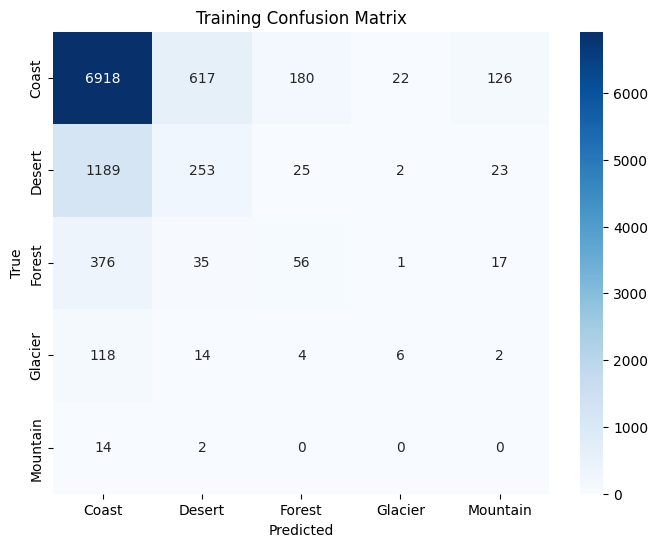

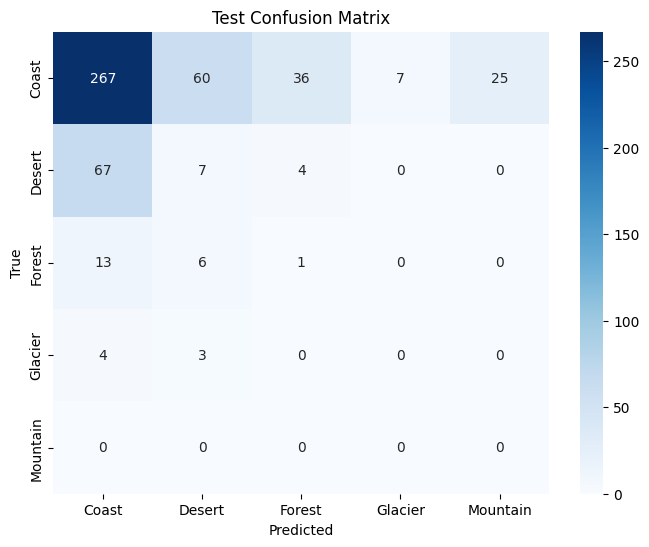

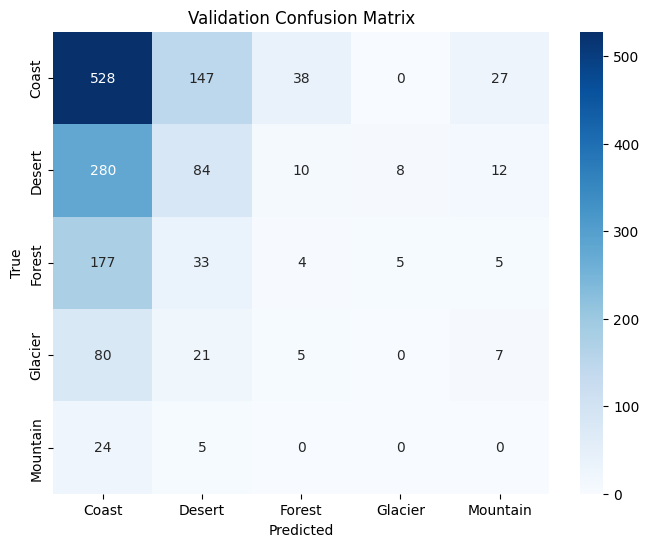

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns
def plot_confusion_matrix(conf_matrix, title, labels):
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()
class_names = ['Coast', 'Desert', 'Forest', 'Glacier', 'Mountain']
plot_confusion_matrix(train_confusion_matrix, "Training Confusion Matrix", class_names)
plot_confusion_matrix(test_confusion_matrix, "Test Confusion Matrix", class_names)
plot_confusion_matrix(val_confusion_matrix, "Validation Confusion Matrix", class_names)

#### 4.3

In [100]:
subset_size = 10
random_indices = random.sample(range(len(x_test)), subset_size)
image_height = 40
image_width = 40
subset_images = x_valid[random_indices]
subset_labels = y_valid[random_indices]
predictions = getPredictions(info, subset_images)

for i in range(subset_size):
    true_class = class_names[subset_labels[i]]
    predicted_class = class_names[predictions[i]]
    posterior_probabilities = calculateClassProbabilities(info, subset_images[i])

    print(f"For image {i + 1} --> True: {true_class}, Predicted: {predicted_class}")


For image 1 --> True: Desert, Predicted: Coast
For image 2 --> True: Desert, Predicted: Desert
For image 3 --> True: Coast, Predicted: Coast
For image 4 --> True: Coast, Predicted: Coast
For image 5 --> True: Coast, Predicted: Desert
For image 6 --> True: Coast, Predicted: Coast
For image 7 --> True: Coast, Predicted: Coast
For image 8 --> True: Coast, Predicted: Coast
For image 9 --> True: Coast, Predicted: Mountain
For image 10 --> True: Coast, Predicted: Desert
